In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/organizations/nih-chest-xrays/data/LOG_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/README_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/BBox_List_2017.csv
/kaggle/input/datasets/organizations/nih-chest-xrays/data/test_list.txt
/kaggle/input/datasets/organizations/nih-chest-xrays/data/ARXIV_V5_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/Data_Entry_2017.csv
/kaggle/input/datasets/organizations/nih-chest-xrays/data/train_val_list.txt
/kaggle/input/datasets/organizations/nih-chest-xrays/data/FAQ_CHESTXRAY.pdf
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006199_010.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004833_016.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006260_000.png
/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004911_010.png
/kaggle/inpu

In [2]:
import os
import glob
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from sklearn.model_selection import train_test_split

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [3]:
DATA_ROOT = "/kaggle/input/nih-chest-xrays"

In [4]:
for root, dirs, files in os.walk(DATA_ROOT):
    for f in files:
        if f.endswith(".csv"):
            print(os.path.join(root, f))

In [5]:
df = pd.read_csv(f"/kaggle/input/datasets/organizations/nih-chest-xrays/data/Data_Entry_2017.csv")

df.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


In [6]:
print(df.shape)

(112120, 12)


In [7]:
df["Target"] = df["Finding Labels"].apply(
    lambda labels: 1 if "Pneumonia" in str(labels).split("|") else 0
)

print(df["Target"].value_counts())

Target
0    110689
1      1431
Name: count, dtype: int64


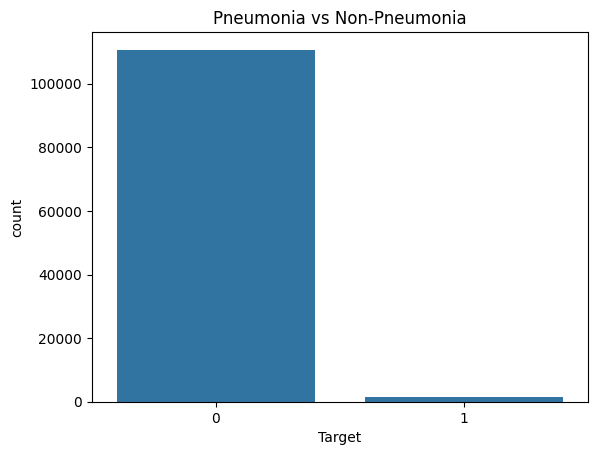

In [8]:
sns.countplot(x="Target", data=df)
plt.title("Pneumonia vs Non-Pneumonia")
plt.show()

In [9]:
pneumonia_df = df[df["Target"] == 1]

non_pneumonia_df = df[df["Target"] == 0].sample(
    n=len(pneumonia_df) * 2,
    random_state=42
)

df_balanced = pd.concat([pneumonia_df, non_pneumonia_df])
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

print(df_balanced["Target"].value_counts())

Target
0    2862
1    1431
Name: count, dtype: int64


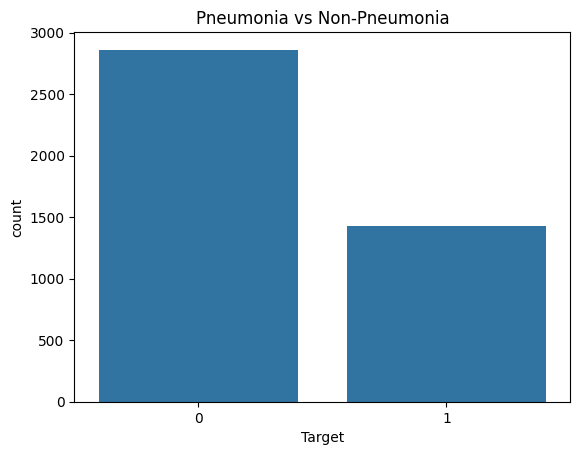

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(x="Target", data=df_balanced)
plt.title("Pneumonia vs Non-Pneumonia")
plt.show()

In [11]:
DATA_ROOT = "/kaggle/input/datasets/organizations/nih-chest-xrays/data"

In [12]:
import os

all_images = []

for root, dirs, files in os.walk(DATA_ROOT):
    for file in files:
        if file.endswith(".png"):
            all_images.append(os.path.join(root, file))

print("Total images found:", len(all_images))
print(all_images[:5])

Total images found: 112120
['/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006199_010.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004833_016.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00006260_000.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004911_010.png', '/kaggle/input/datasets/organizations/nih-chest-xrays/data/images_003/images/00004186_007.png']


In [13]:
image_path_map = {os.path.basename(x): x for x in all_images}

df_balanced["path"] = df_balanced["Image Index"].map(image_path_map)
df_balanced = df_balanced.dropna(subset=["path"]).reset_index(drop=True)

print(df_balanced.shape)
print(df_balanced["path"].isnull().sum())
df_balanced[["Image Index", "path"]].head()

(4293, 14)
0


,Image Index,path
0,00018472_001.png,/kaggle/input/datasets/organizations/nih-chest...
1,00000116_020.png,/kaggle/input/datasets/organizations/nih-chest...
2,00002003_002.png,/kaggle/input/datasets/organizations/nih-chest...
3,00016490_019.png,/kaggle/input/datasets/organizations/nih-chest...
4,00026050_010.png,/kaggle/input/datasets/organizations/nih-chest...


In [14]:
from sklearn.model_selection import train_test_split

train_df, temp_df = train_test_split(
    df_balanced,
    test_size=0.3,
    stratify=df_balanced["Target"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.5,
    stratify=temp_df["Target"],
    random_state=42
)

print("Train shape:", train_df.shape)
print("Validation shape:", val_df.shape)
print("Test shape:", test_df.shape)

Train shape: (3005, 14)
Validation shape: (644, 14)
Test shape: (644, 14)


In [15]:
print("Train target distribution:")
print(train_df["Target"].value_counts())

print("\nValidation target distribution:")
print(val_df["Target"].value_counts())

print("\nTest target distribution:")
print(test_df["Target"].value_counts())

Train target distribution:
Target
0    2003
1    1002
Name: count, dtype: int64

Validation target distribution:
Target
0    429
1    215
Name: count, dtype: int64

Test target distribution:
Target
0    430
1    214
Name: count, dtype: int64


In [16]:
from torchvision import transforms

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

In [17]:
def clahe_enhancement(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(gray)
    img = cv2.cvtColor(cl, cv2.COLOR_GRAY2RGB)
    return img

In [18]:
class ChestXrayDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.loc[idx, "path"]
        label = self.dataframe.loc[idx, "Target"]

        image = Image.open(img_path).convert("RGB")
        image = np.array(image)

        image = clahe_enhancement(image)
        image = Image.fromarray(image)

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.float32)

In [19]:
train_dataset = ChestXrayDataset(train_df, transform=train_transform)
val_dataset = ChestXrayDataset(val_df, transform=val_test_transform)
test_dataset = ChestXrayDataset(test_df, transform=val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

print("Train dataset size:", len(train_dataset))
print("Validation dataset size:", len(val_dataset))
print("Test dataset size:", len(test_dataset))
print("Train batches:", len(train_loader))
print("Validation batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train dataset size: 3005
Validation dataset size: 644
Test dataset size: 644
Train batches: 94
Validation batches: 21
Test batches: 21


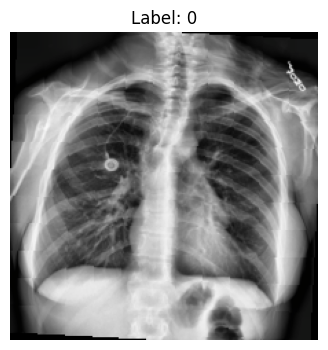

In [20]:
images, labels = next(iter(train_loader))

img = images[0].permute(1, 2, 0).numpy()
img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
img = np.clip(img, 0, 1)

plt.figure(figsize=(4,4))
plt.imshow(img)
plt.title(f"Label: {int(labels[0].item())}")
plt.axis("off")
plt.show()

In [21]:
import os

os.makedirs("/kaggle/working/processed_data", exist_ok=True)

train_df.to_csv("/kaggle/working/processed_data/train.csv", index=False)
val_df.to_csv("/kaggle/working/processed_data/val.csv", index=False)
test_df.to_csv("/kaggle/working/processed_data/test.csv", index=False)

print("Saved successfully to /kaggle/working/processed_data")

Saved successfully to /kaggle/working/processed_data


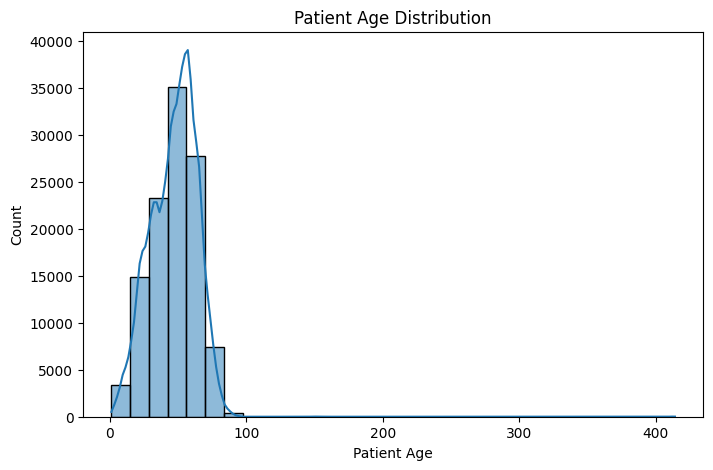

count    112120.000000
mean         46.901463
std          16.839923
min           1.000000
25%          35.000000
50%          49.000000
75%          59.000000
max         414.000000
Name: Patient Age, dtype: float64


In [22]:
plt.figure(figsize=(8,5))
sns.histplot(df["Patient Age"], bins=30, kde=True)
plt.title("Patient Age Distribution")
plt.show()

print(df["Patient Age"].describe())

Patient Gender
M    63340
F    48780
Name: count, dtype: int64


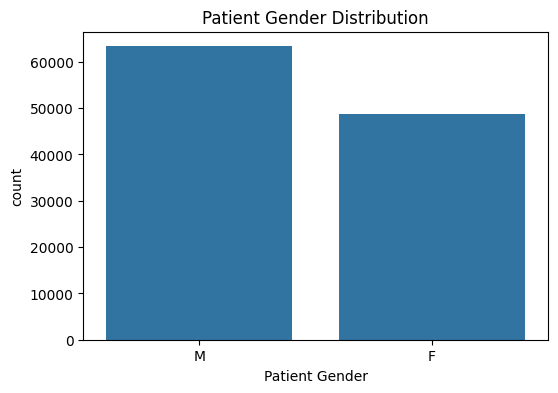

In [23]:
print(df["Patient Gender"].value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x="Patient Gender", data=df)
plt.title("Patient Gender Distribution")
plt.show()

View Position
PA    67310
AP    44810
Name: count, dtype: int64


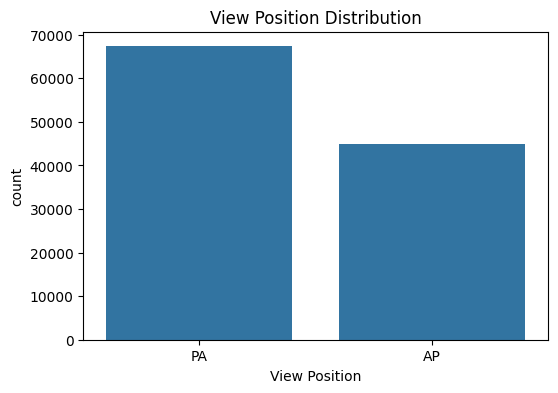

In [24]:
print(df["View Position"].value_counts())

plt.figure(figsize=(6,4))
sns.countplot(x="View Position", data=df)
plt.title("View Position Distribution")
plt.show()

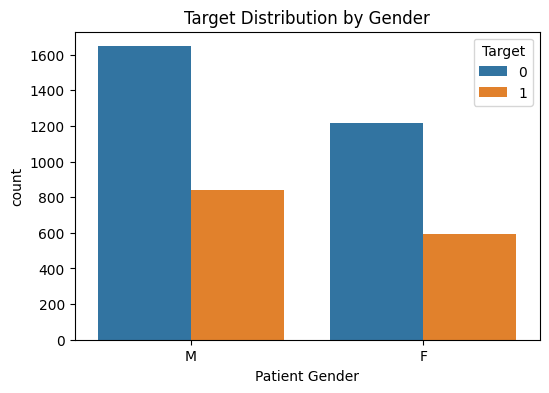

In [25]:
plt.figure(figsize=(6,4))
sns.countplot(x="Patient Gender", hue="Target", data=df_balanced)
plt.title("Target Distribution by Gender")
plt.show()

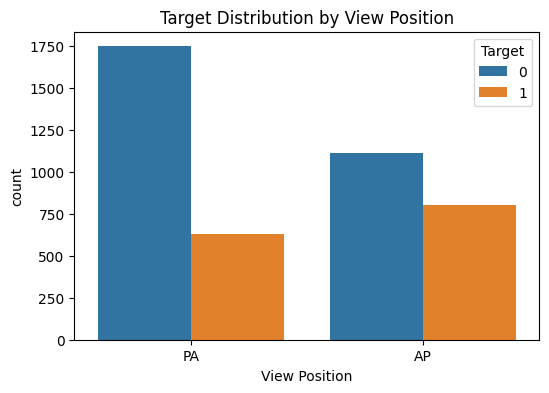

In [26]:
plt.figure(figsize=(6,4))
sns.countplot(x="View Position", hue="Target", data=df_balanced)
plt.title("Target Distribution by View Position")
plt.show()

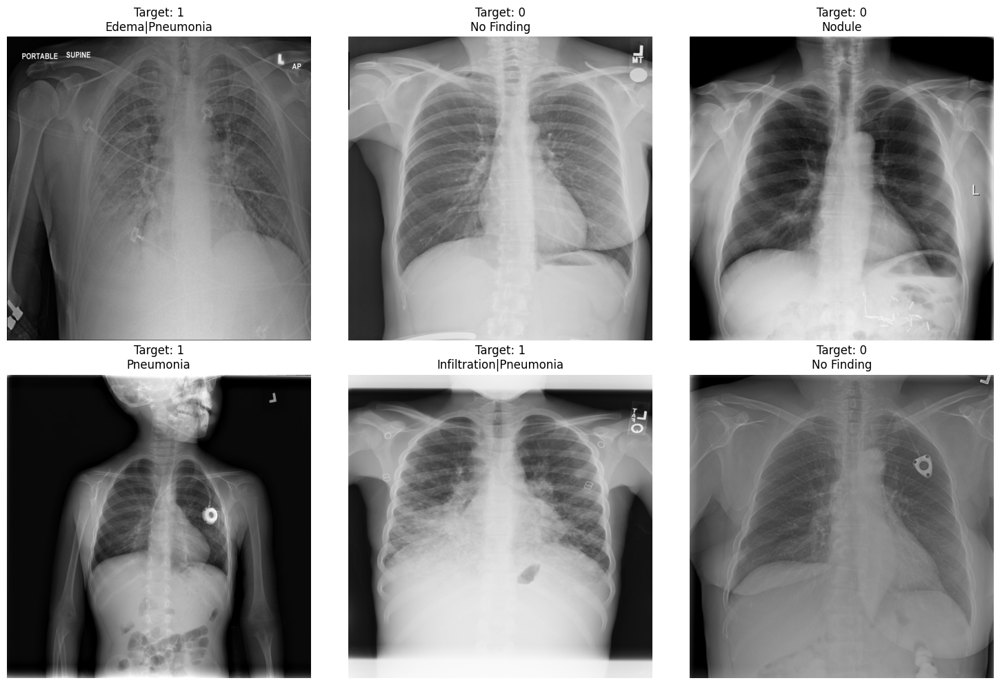

In [27]:
sample_rows = df_balanced.sample(6, random_state=42)

plt.figure(figsize=(15,10))
for i, (_, row) in enumerate(sample_rows.iterrows()):
    img = Image.open(row["path"]).convert("RGB")
    plt.subplot(2,3,i+1)
    plt.imshow(img, cmap="gray")
    plt.title(f'Target: {row["Target"]}\n{row["Finding Labels"]}')
    plt.axis("off")

plt.tight_layout()
plt.show()

In [28]:
print("EDA and preprocessing completed successfully.")
print("Final balanced dataset size:", df_balanced.shape)
print("Train set:", train_df.shape)
print("Validation set:", val_df.shape)
print("Test set:", test_df.shape)

EDA and preprocessing completed successfully.
Final balanced dataset size: (4293, 14)
Train set: (3005, 14)
Validation set: (644, 14)
Test set: (644, 14)


In [29]:
!pip install ultralytics grad-cam -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 84.3 MB/s eta 0:00:00:00:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 57.8 MB/s eta 0:00:00


In [30]:
from ultralytics import YOLO

import torch
import torch.nn as nn

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    roc_auc_score,
    roc_curve
)

import seaborn as sns

# Explainability
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [31]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

cuda


In [121]:
model = YOLO("yolo11n-cls.pt")

# recreate final layer
in_features = model.model.model[-1].linear.in_features

model.model.model[-1].linear = nn.Linear(in_features, 2)

# MOVE ENTIRE MODEL AGAIN TO GPU
model.model = model.model.to(device)

# loss
criterion = nn.CrossEntropyLoss()

# optimizer
optimizer = torch.optim.Adam(
    model.model.parameters(),
    lr=1e-5
)

In [122]:
EPOCHS = 5

train_losses = []
val_losses = []

In [123]:
for epoch in range(EPOCHS):

    # TRAINING
    model.model.train()

    running_loss = 0

    for images, labels in train_loader:

        images = images.to(device)

        labels = labels.long().to(device)

        optimizer.zero_grad()

        outputs = model.model(images)

        if isinstance(outputs, tuple):
            outputs = outputs[0]

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

    train_loss = running_loss / len(train_loader)

    train_losses.append(train_loss)

    # VALIDATION
    model.model.eval()

    val_running_loss = 0

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(device)

            labels = labels.long().to(device)

            outputs = model.model(images)

            if isinstance(outputs, tuple):
                outputs = outputs[0]

            loss = criterion(outputs, labels)

            val_running_loss += loss.item()

    val_loss = val_running_loss / len(val_loader)

    val_losses.append(val_loss)

    print(
        f"Epoch [{epoch+1}/{EPOCHS}] "
        f"Train Loss: {train_loss:.4f} "
        f"Val Loss: {val_loss:.4f}"
    )

Epoch [1/5] Train Loss: 0.6689 Val Loss: 0.6523
Epoch [2/5] Train Loss: 0.6552 Val Loss: 0.6490
Epoch [3/5] Train Loss: 0.6500 Val Loss: 0.6460
Epoch [4/5] Train Loss: 0.6427 Val Loss: 0.6457
Epoch [5/5] Train Loss: 0.6402 Val Loss: 0.6453


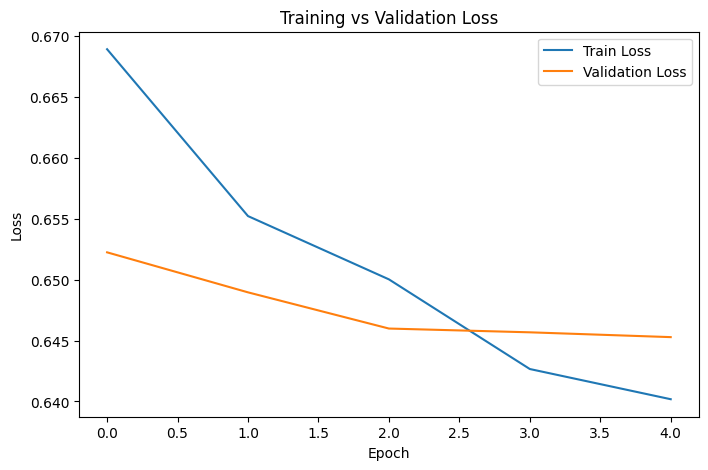

In [124]:
plt.figure(figsize=(8,5))

plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.title("Training vs Validation Loss")

plt.legend()

plt.show()

In [125]:
model.model.eval()

y_true = []
y_pred = []
y_prob = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)

        outputs = model.model(images)

        if isinstance(outputs, tuple):
            outputs = outputs[0]
        
        probs = torch.softmax(outputs, dim=1)

        preds = torch.argmax(probs, dim=1)

        y_true.extend(labels.numpy())

        y_pred.extend(preds.cpu().numpy())

        y_prob.extend(probs[:,1].cpu().numpy())

In [126]:
acc = accuracy_score(y_true, y_pred)

auc = roc_auc_score(y_true, y_prob)

print(f"Accuracy: {acc:.4f}")
print(f"AUC Score: {auc:.4f}")

print(classification_report(y_true, y_pred))

Accuracy: 0.6568
AUC Score: 0.5540
              precision    recall  f1-score   support

         0.0       0.67      0.94      0.79       430
         1.0       0.42      0.08      0.14       214

    accuracy                           0.66       644
   macro avg       0.55      0.51      0.46       644
weighted avg       0.59      0.66      0.57       644



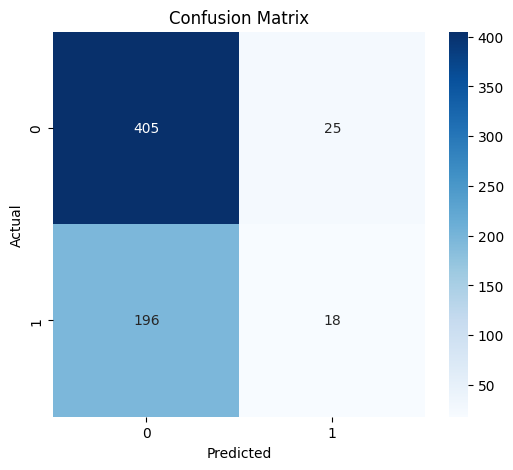

In [127]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues"
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")

plt.show()

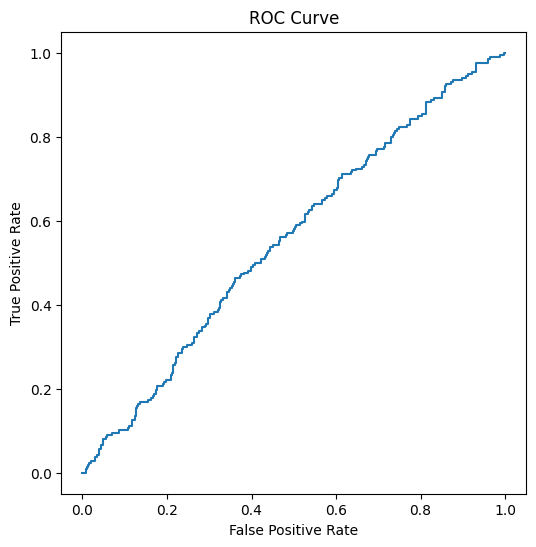

In [128]:
fpr, tpr, _ = roc_curve(y_true, y_prob)

plt.figure(figsize=(6,6))

plt.plot(fpr, tpr)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")

plt.title("ROC Curve")

plt.show()

In [129]:
for i, layer in enumerate(wrapped_model.model.model):
    print(i, type(layer), layer)

0 <class 'ultralytics.nn.modules.conv.Conv'> Conv(
  (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act): SiLU(inplace=True)
)
1 <class 'ultralytics.nn.modules.conv.Conv'> Conv(
  (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act): SiLU(inplace=True)
)
2 <class 'ultralytics.nn.modules.block.C3k2'> C3k2(
  (cv1): Conv(
    (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): SiLU(inplace=True)
  )
  (cv2): Conv(
    (conv): Conv2d(48, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act): SiLU(inplace=True)
  )
  (m): Mo

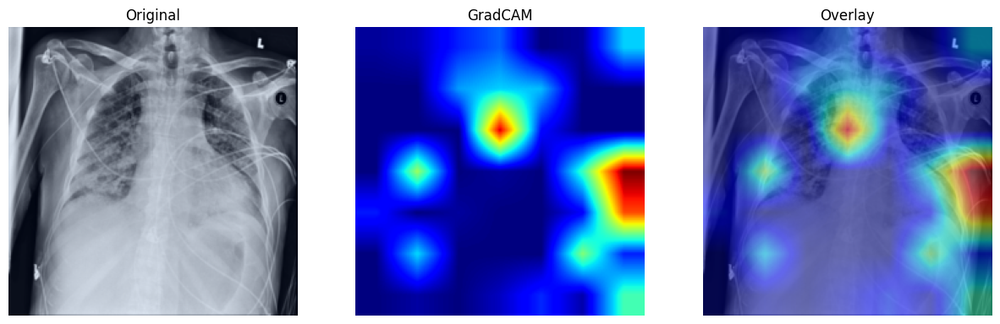

In [130]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import cv2
target_layer = model.model.model[10].conv

def forward_hook(module, input, output):

    if isinstance(output, tuple):
        output = output[0]

    activations.append(output)

fh = target_layer.register_forward_hook(forward_hook)

sample_img, sample_label = test_dataset[0]

input_tensor = sample_img.unsqueeze(0).to(device)

model.model.eval()

activations.clear()
gradients.clear()

with torch.enable_grad():
    
    input_tensor = input_tensor.requires_grad_(True)

    output = model.model(input_tensor)

    if isinstance(output, tuple):
        output = output[0]

    score = output[:, 1]
    
if isinstance(output, tuple):
    output = output[0]

score = output[:, 0]

activation = activations[0]

activation.retain_grad()

model.model.zero_grad()

score.backward()

gradient = activation.grad

weights = gradient.mean(dim=(2,3), keepdim=True)

cam = (weights * activation).sum(dim=1).squeeze()

cam = F.relu(cam)

cam = cam.detach().cpu().numpy()

cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

rgb_img = sample_img.permute(1,2,0).cpu().numpy()

rgb_img = rgb_img - rgb_img.min()
rgb_img = rgb_img / rgb_img.max()

cam = cv2.resize(cam, (rgb_img.shape[1], rgb_img.shape[0]))

plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(rgb_img)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(cam, cmap="jet")
plt.title("GradCAM")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(rgb_img)
plt.imshow(cam, cmap="jet", alpha=0.5)
plt.title("Overlay")
plt.axis("off")

plt.show()

fh.remove()

In [136]:
feature_extractor = nn.Sequential(
    *list(model.model.model.children())[:5]
)

feature_extractor.eval()

with torch.no_grad():

    feature_maps = feature_extractor(
        input_tensor
    )

feature_maps = feature_maps.cpu().numpy()

plt.figure(figsize=(12,12))

<Figure size 1200x1200 with 0 Axes>

<Figure size 1200x1200 with 0 Axes>

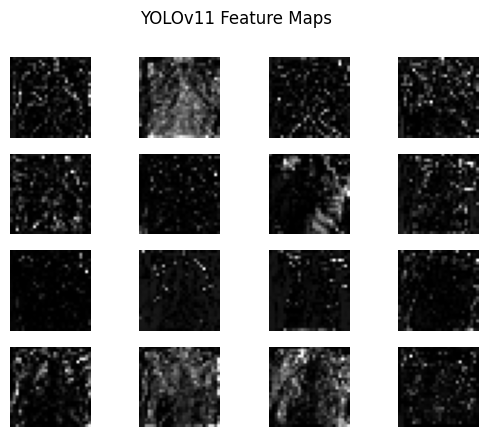

In [138]:

for i in range(16):

    plt.subplot(4,4,i+1)

    plt.imshow(feature_maps[0, i], cmap='gray')

    plt.axis("off")

plt.suptitle("YOLOv11 Feature Maps")

plt.show()

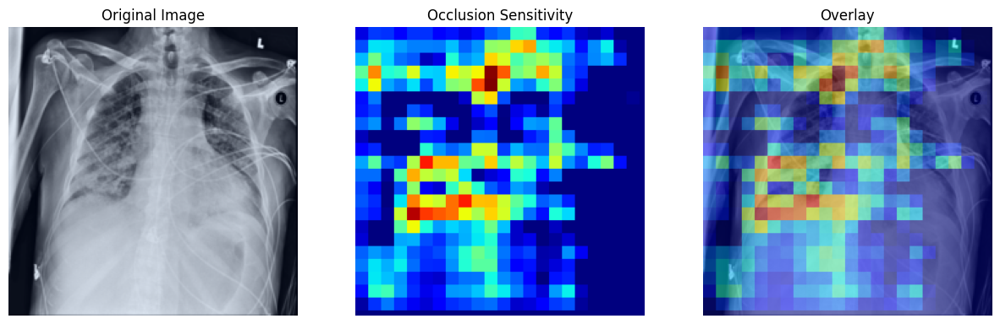

In [134]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import cv2

# sample image
sample_img, sample_label = test_dataset[0]

input_tensor = sample_img.unsqueeze(0).to(device)

model.model.eval()

# original prediction
with torch.no_grad():

    original_output = model.model(input_tensor)

    if isinstance(original_output, tuple):
        original_output = original_output[0]

    original_score = torch.softmax(original_output, dim=1)[0,1].item()
# parameters
patch_size = 20
stride = 10

heatmap = np.zeros((224,224))

# sliding window
for y in range(0, 224-patch_size, stride):

    for x in range(0, 224-patch_size, stride):

        occluded = input_tensor.clone()

        occluded[:, :, y:y+patch_size, x:x+patch_size] = 0

        with torch.no_grad():

            output = model.model(occluded)

            if isinstance(output, tuple):
                output = output[0]

            score = torch.softmax(output, dim=1)[0,1].item()

        drop = original_score - score

        heatmap[y:y+patch_size, x:x+patch_size] += drop

# normalize
heatmap = np.maximum(heatmap, 0)

heatmap = (heatmap - heatmap.min()) / (
    heatmap.max() - heatmap.min() + 1e-8
)

# original image
rgb_img = sample_img.permute(1,2,0).cpu().numpy()

rgb_img = rgb_img - rgb_img.min()
rgb_img = rgb_img / rgb_img.max()

# plot
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(rgb_img)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(heatmap, cmap='jet')
plt.title("Occlusion Sensitivity")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(rgb_img)
plt.imshow(heatmap, cmap='jet', alpha=0.5)
plt.title("Overlay")
plt.axis("off")

plt.show()

In [135]:
torch.save(
    model.model.state_dict(),
    "/kaggle/working/yolov11_pneumonia.pth"
)

print("YOLOv11 model saved successfully.")

YOLOv11 model saved successfully.
